# Diffusion Models

## Additional Material
Video Tutorials:
- DDPM: https://www.youtube.com/watch?v=EhndHhIvWWw&t=10s
- Score-based: https://www.youtube.com/watch?v=lUljxdkolK8
- Flow Matching: https://www.youtube.com/watch?v=7cMzfkWFWhI
- Rectified Flow: https://www.youtube.com/watch?v=5zpRVD7l-h0


Papers collection:
- https://github.com/wangkai930418/awesome-diffusion-categorized
- https://github.com/AIoT-MLSys-Lab/Efficient-Diffusion-Model-Survey


Libraries:
- TorchDiff: https://github.com/LoqmanSamani/TorchDiff
- Diffusers: https://huggingface.co/docs/diffusers

## Common Modules

In [ ]:
import torch
from torch import nn
import torchvision
import numpy as np
import math
from torch.utils.data import DataLoader
from torchvision import transforms

IMG_SIZE = 64
BATCH_SIZE = 64

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.OxfordIIITPet(root=".", download=True,
                                         transform=data_transform)

    test = torchvision.datasets.OxfordIIITPet(root=".", download=True,
                                         transform=data_transform, split='test')

    return torch.utils.data.ConcatDataset([train, test])

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)




100%|██████████| 792M/792M [00:07<00:00, 104MB/s] 
100%|██████████| 19.2M/19.2M [00:00<00:00, 70.2MB/s]


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

### UNet



In [ ]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 64

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)


### Continious Unet

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# =====================
# UNet Building Block
# =====================
class ContinuousBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)

        if up:
            self.conv1 = nn.Conv2d(2 * in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)

        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU()

    def forward(self, x, t_emb):
        h = self.bnorm1(self.relu(self.conv1(x)))
        time_emb = self.relu(self.time_mlp(t_emb))
        time_emb = time_emb[:, :, None, None]
        h = h + time_emb
        h = self.bnorm2(self.relu(self.conv2(h)))
        return self.transform(h)

# =====================
# Simple Continuous UNet (no sinusoidal embeddings)
# =====================
class SimpleContinuousUnet(nn.Module):
    def __init__(self, image_channels=3, time_emb_dim=32):
        super().__init__()
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = image_channels

        # MLP for scalar t
        self.time_mlp = nn.Sequential(
            nn.Linear(1, time_emb_dim*4),
            nn.ReLU(),
            nn.Linear(time_emb_dim*4, time_emb_dim),
            nn.ReLU(),
        )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Down / Up
        self.downs = nn.ModuleList([
            ContinuousBlock(down_channels[i], down_channels[i + 1], time_emb_dim)
            for i in range(len(down_channels) - 1)
        ])
        self.ups = nn.ModuleList([
            ContinuousBlock(up_channels[i], up_channels[i + 1], time_emb_dim, up=True)
            for i in range(len(up_channels) - 1)
        ])

        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, t):
        """
        x: (B, C, H, W)
        t: (B, 1) scalar continuous values in [0,1]
        """
        t_emb = self.time_mlp(t)
        x = self.conv0(x)
        residuals = []

        for down in self.downs:
            x = down(x, t_emb)
            residuals.append(x)

        for up in self.ups:
            res = residuals.pop()
            x = torch.cat((x, res), dim=1)
            x = up(x, t_emb)

        return self.output(x)



## [DDPM](https://arxiv.org/pdf/2006.11239)

### Forward process

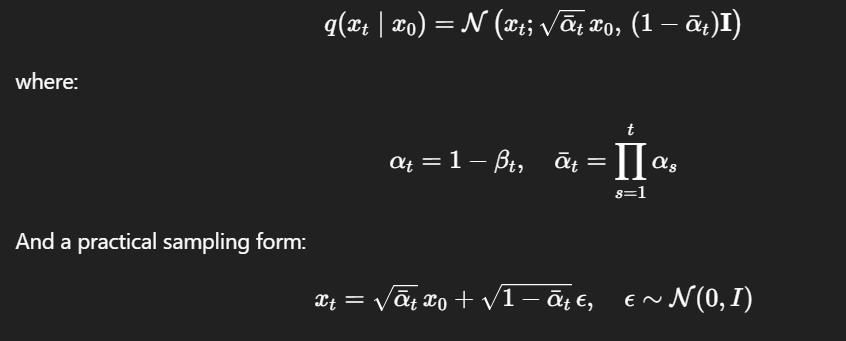

In [ ]:
def make_beta_schedule(T, start=1e-4, end=0.02, schedule="linear"):
    """
    Returns beta schedule of length T.
    """
    if schedule == "linear":
        return torch.linspace(start, end, T)
    elif schedule == "cosine":
        steps = torch.arange(T+1, dtype=torch.float32) / T
        alphas_cumprod = torch.cos((steps + 0.008) / 1.008 * torch.pi / 2) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return betas.clamp(max=0.999)
    else:
        raise ValueError("Unknown schedule type")


T = 300
betas = make_beta_schedule(T, schedule="linear")
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)


In [ ]:
def q_sample(x0, t, alphas_cumprod, device):
    """
    Diffuse the data x0 at timestep t using precomputed alphas_cumprod.
    x0: (batch, dim) clean data
    t: (batch,) integer timesteps
    """
    noise = torch.randn_like(x0).to(device)

    sqrt_alphas_cumprod_t = alphas_cumprod[t].to(device)
    sqrt_alphas_cumprod_t = sqrt_alphas_cumprod_t.sqrt().view(-1, 1, 1, 1)
    sqrt_one_minus_alphas_cumprod_t = (1 - alphas_cumprod[t]).sqrt().view(-1, 1, 1, 1)
    x_t = sqrt_alphas_cumprod_t*x0 + sqrt_one_minus_alphas_cumprod_t * noise

    return x_t, noise

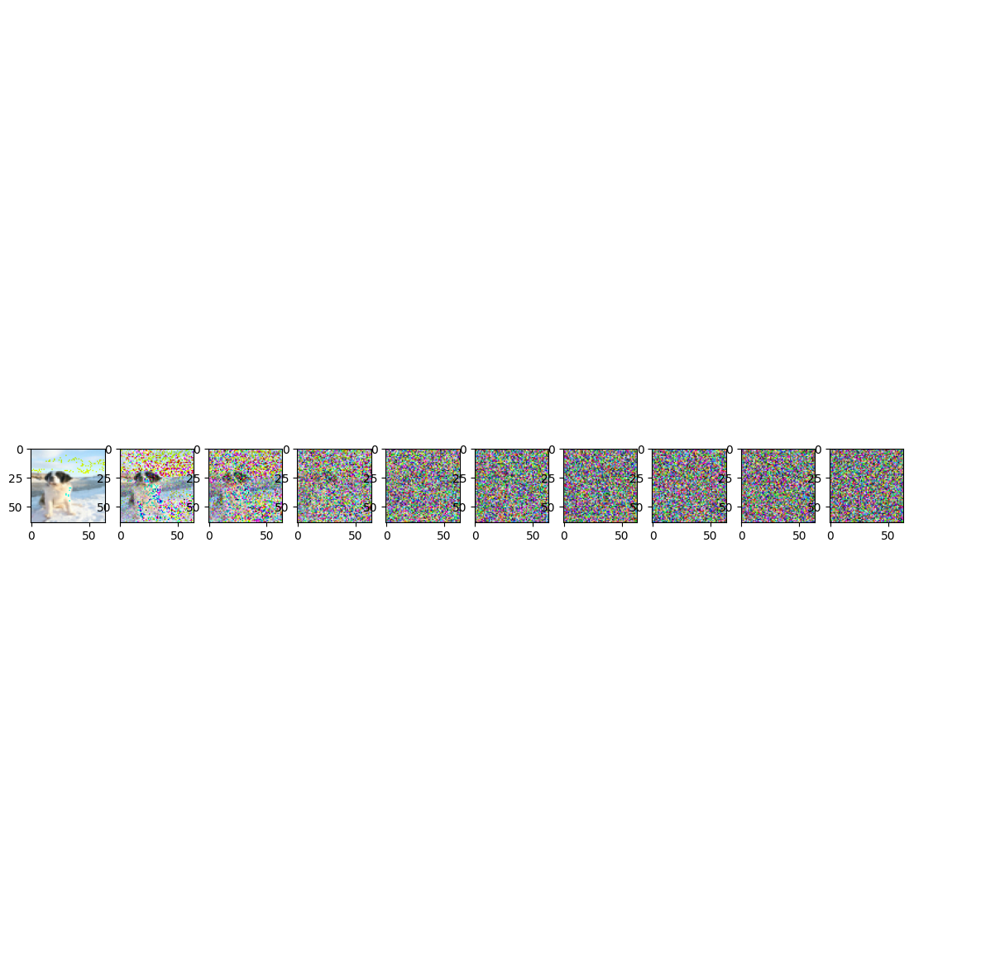

In [ ]:
import matplotlib.pyplot as plt


# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = q_sample(image, t, alphas_cumprod, 'cpu')
    show_tensor_image(img)

### Backward Process (Denoising)
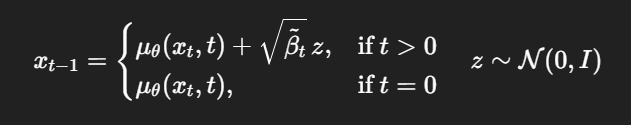

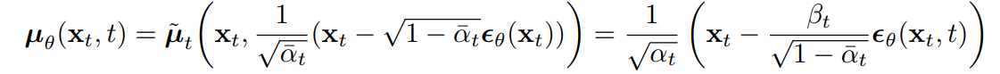


In [ ]:
@torch.no_grad()
def p_sample(model, x, t, betas, alphas, alphas_cumprod):
    """
    One reverse sampling step of DDPM.
    model: neural net predicting noise εθ(x_t, t)
    x: (batch, dim) current noisy sample
    t: int, current timestep
    """
    beta_t = betas[t]
    alpha_t = alphas[t]
    alpha_cumprod_t = alphas_cumprod[t]
    alpha_cumprod_prev = alphas_cumprod[t-1] if t > 0 else torch.tensor(1.0, device=x.device)


    t = torch.tensor([t], device=device)
    # predict noise
    eps_theta = model(x, t)

    # compute mean
    mean = (1/ alpha_t.sqrt()) * (x - beta_t / (1-alpha_cumprod_t).sqrt()) * eps_theta

    if t > 0:
        # variance for this step
        variance = beta_t * (1. - alpha_cumprod_prev)/(1- alpha_cumprod_t)
        sigma_t = variance.sqrt()
        noise = torch.randn_like(mean).to(device)
        return mean + sigma_t * noise
    else:
        return mean

@torch.no_grad()
def sample_and_plot(model, shape, betas, alphas, alphas_cumprod, device="cuda"):
    """
    Full DDPM sampling loop from noise.
    """
    T = len(betas)
    num_images = 10
    stepsize = int(T/num_images)
    x = torch.randn(shape, device=device)  # start from Gaussian noise
    for t in reversed(range(T)):
        x = p_sample(model, x, t, betas, alphas, alphas_cumprod)
        x = torch.clamp(x, -1.0, 1.0)
        if t % stepsize == 0:
            plt.subplot(1, num_images, int(t/stepsize)+1)
            show_tensor_image(x.detach().cpu())
    plt.show()

### Loss Function

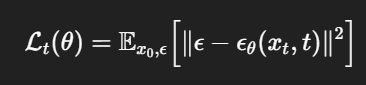

In [ ]:
import torch.nn.functional as F

def get_ddpm_loss(model, x0, t, device):
    x_noisy, noise = q_sample(x0, t, alphas_cumprod, device)
    noise_pred = model(x_noisy, t)
    return F.mse_loss(noise, noise_pred)

### Training

Epoch 0 | step 000 Loss: 0.8116345405578613 


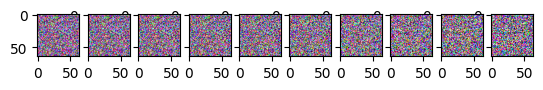

Epoch 5 | step 000 Loss: 0.1657467782497406 


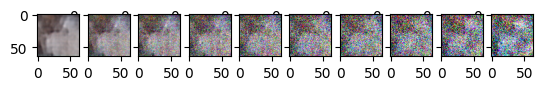

Epoch 10 | step 000 Loss: 0.16800904273986816 


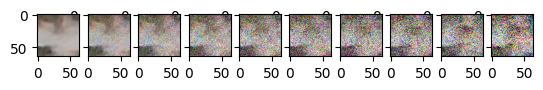

Epoch 15 | step 000 Loss: 0.14922025799751282 


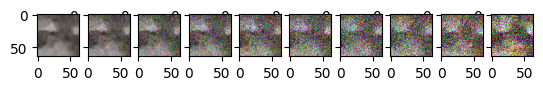

Epoch 20 | step 000 Loss: 0.15675577521324158 


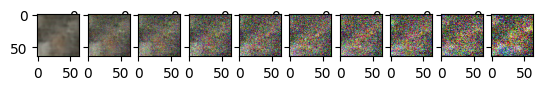

Epoch 25 | step 000 Loss: 0.1420104205608368 


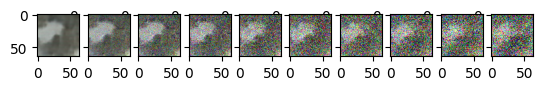

KeyboardInterrupt: 

In [ ]:
from torch.optim import Adam

model = SimpleUnet().to(device)
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()
      img = batch[0].to(device)

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_ddpm_loss(model, img, t, device)
      loss.backward()
      optimizer.step()

      if epoch % 2 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_and_plot(model, img.shape, betas, alphas, alphas_cumprod, device)

## [Flow Matching](https://arxiv.org/pdf/2210.02747)

### Forward process

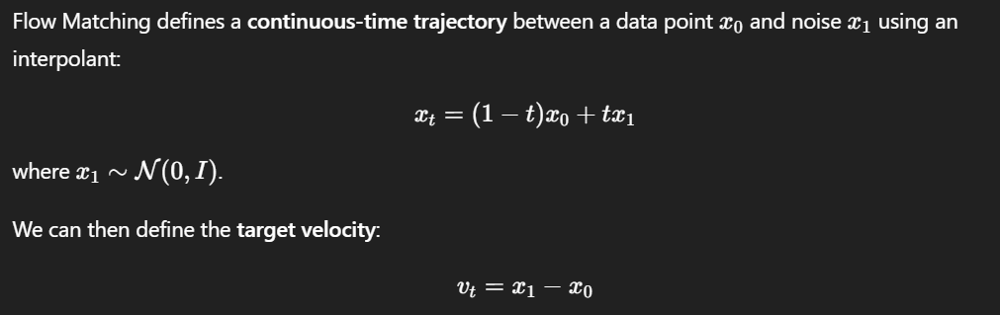

In [ ]:
def forward_flow_matching(x0, t=None, device="cuda"):
    """
    Forward process for flow matching.

    Args:
        x0: Clean data sample (batch, channels, height, width)
        t: Optional time values in [0, 1]. Random if None.
        device: Device.

    Returns:
        x_t: Interpolated noisy sample
        v_t: Target velocity field
        x1: Random Gaussian endpoint
        t: Time tensor
    """
    if t is None:
        t = torch.rand((x0.size(0), 1, 1, 1), device=device)
    x1 = torch.randn_like(x0).to(device)
    x_t = (1 - t) * x0 + t * x1
    v_t = x1 - x0
    x_t.clamp(-1, 1)
    return x_t, v_t, x1, t

### Backward Process

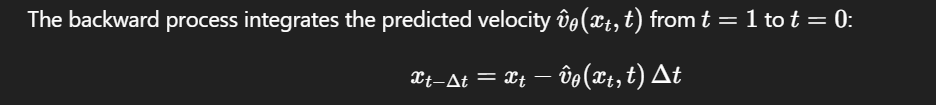

In [ ]:
@torch.no_grad()
def backward_flow_matching_euler(model, x, t, dt):
    """
    Backward process (sampling) for flow matching.

    Args:
        model: Neural network predicting v_hat(x_t, t)
        x: Previous denoised sample
        t: Timestep
        dt: Euler delta timestep
        device: Device

    Returns:
        x0_pred: Sampled data (denoised)
    """
    v_hat = model(x, t)
    x = x - v_hat * dt
    x = x.clamp(-1, 1)
    return x

In [ ]:
import matplotlib.pyplot as plt


@torch.no_grad()
def sample_and_plot_flow(model, shape, n_steps=100, device="cuda"):
    """
    Flow Matching sampling and visualization.

    Args:
        model: Neural network predicting velocity field.
        shape: Output tensor shape (batch, C, H, W)
        n_steps: Integration steps
        device: Device
    """
    num_images = 10
    step_interval = int(n_steps / num_images)
    x = torch.randn(shape, device=device)  # Start from noise
    dt = 1.0 / n_steps

    plt.figure(figsize=(15, 3))
    for i in reversed(range(n_steps)):
        t = torch.full((x.size(0), 1), i / n_steps, device=device)
        x = backward_flow_matching_euler(model, x, t, dt)
        if i % step_interval == 0:
            plt.subplot(1, num_images, int(i / step_interval) + 1)
            show_tensor_image(x.detach().cpu())
    plt.show()

### Loss

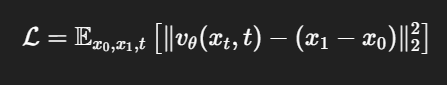

In [ ]:
import torch.nn.functional as F

def get_flow_matching_loss(model, x0, t, device="cuda"):
    """
    Compute flow matching loss.

    Args:
        model: neural net predicting velocity v_theta(x_t, t)
        x0: clean data sample (batch, C, H, W)
    """

    x_t, v_target, _, _ = forward_flow_matching(x0, t, device)

    v_pred = model(x_t, t)
    loss = F.mse_loss(v_pred, v_target)
    return loss

### Training

Epoch 0 | step 000 Loss: 1.2734421491622925 


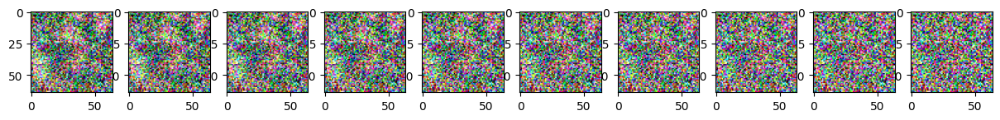

Epoch 2 | step 000 Loss: 0.2029629647731781 


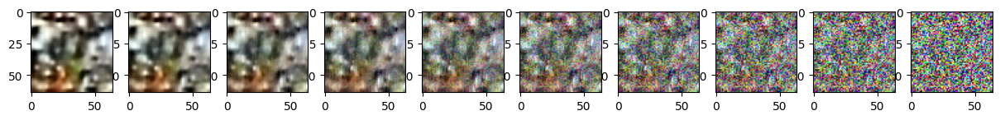

Epoch 4 | step 000 Loss: 0.1740606725215912 


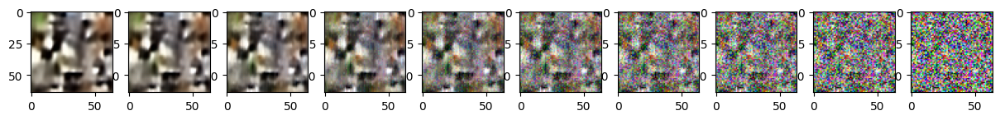

Epoch 6 | step 000 Loss: 0.1768639087677002 


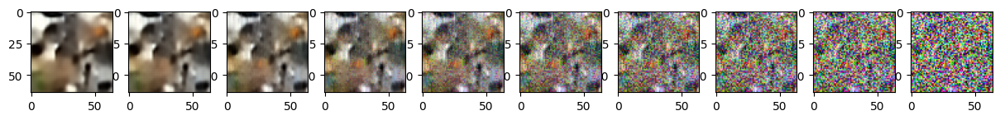

Epoch 8 | step 000 Loss: 0.1647239476442337 


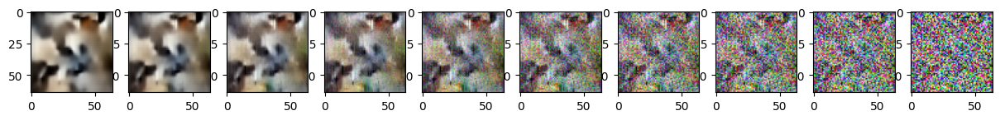

Epoch 10 | step 000 Loss: 0.19834408164024353 


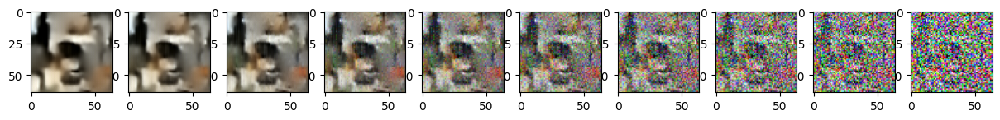

Epoch 12 | step 000 Loss: 0.14951324462890625 


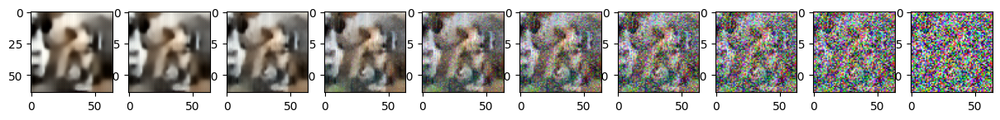

Epoch 14 | step 000 Loss: 0.15375396609306335 


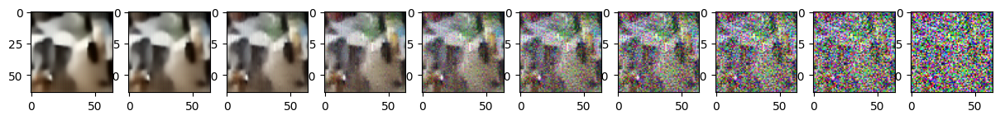

Epoch 16 | step 000 Loss: 0.16671228408813477 


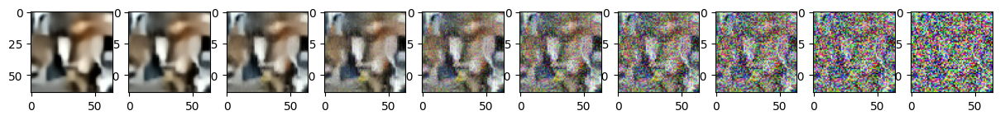

Epoch 18 | step 000 Loss: 0.15988251566886902 


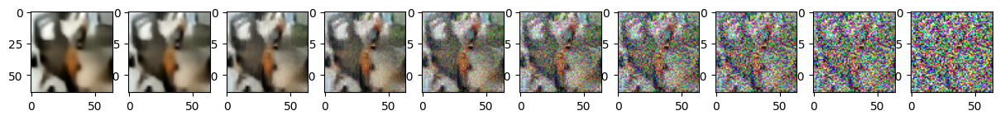

Epoch 20 | step 000 Loss: 0.14323878288269043 


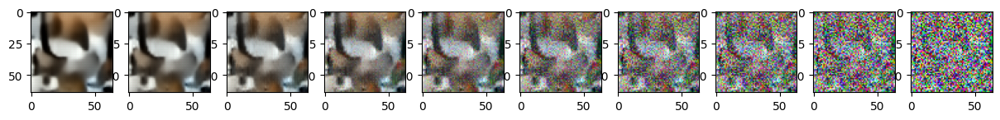

Epoch 22 | step 000 Loss: 0.18852059543132782 


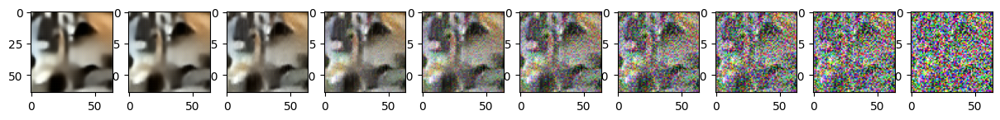

Epoch 24 | step 000 Loss: 0.14807869493961334 


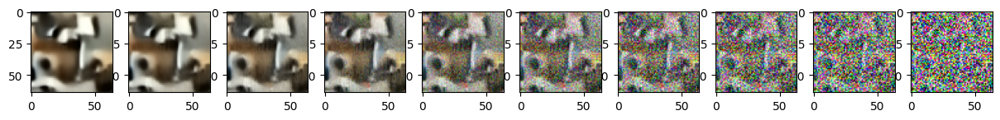

Epoch 26 | step 000 Loss: 0.16959261894226074 


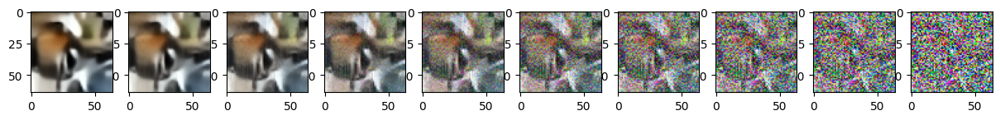

Epoch 28 | step 000 Loss: 0.13991114497184753 


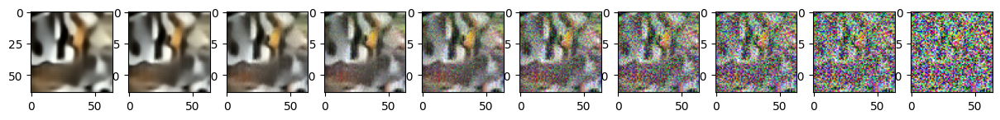

Epoch 30 | step 000 Loss: 0.12502895295619965 


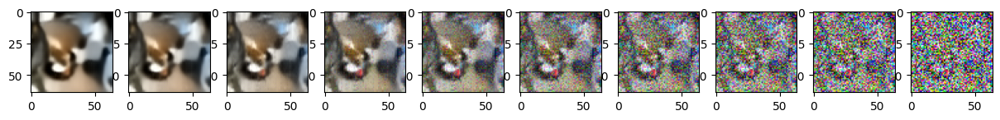

Epoch 32 | step 000 Loss: 0.14612042903900146 


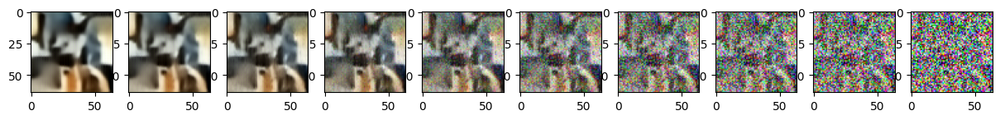

Epoch 34 | step 000 Loss: 0.14866885542869568 


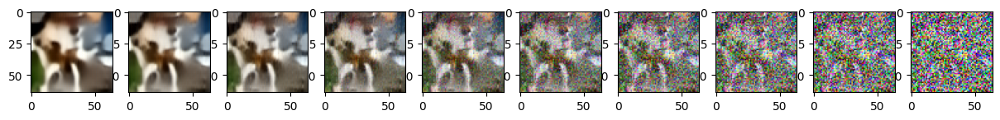

Epoch 36 | step 000 Loss: 0.17010831832885742 


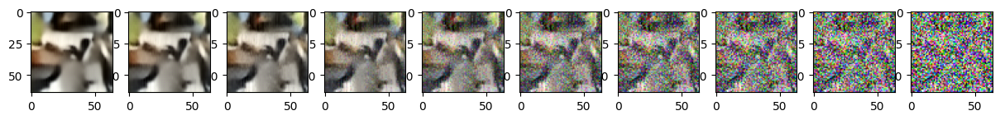

Epoch 38 | step 000 Loss: 0.16016200184822083 


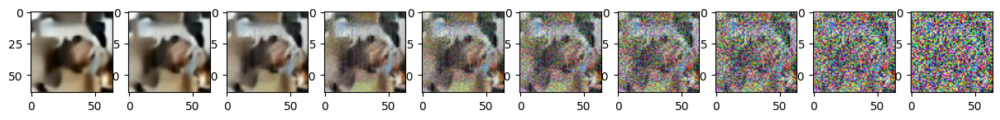

Epoch 40 | step 000 Loss: 0.13240671157836914 


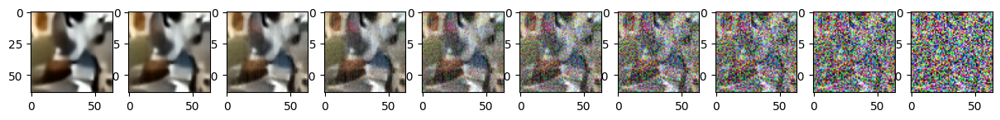

Epoch 42 | step 000 Loss: 0.17574423551559448 


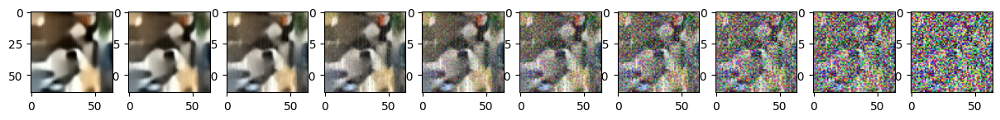

Epoch 44 | step 000 Loss: 0.15232843160629272 


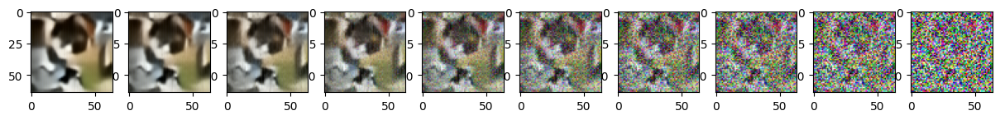

Epoch 46 | step 000 Loss: 0.11728304624557495 


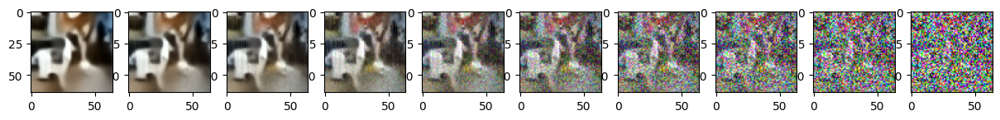

Epoch 48 | step 000 Loss: 0.15401789546012878 


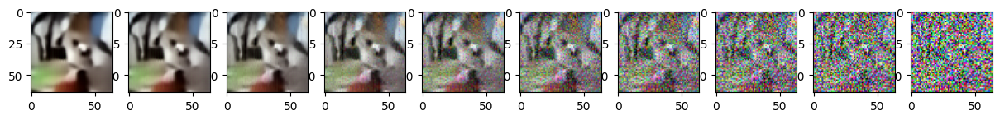

Epoch 50 | step 000 Loss: 0.1468476802110672 


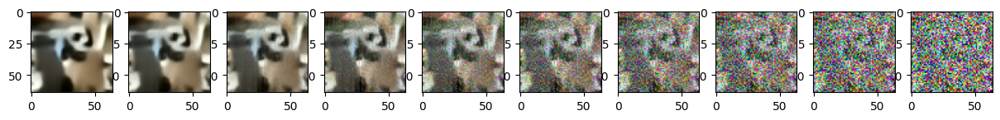

Epoch 52 | step 000 Loss: 0.2020467221736908 


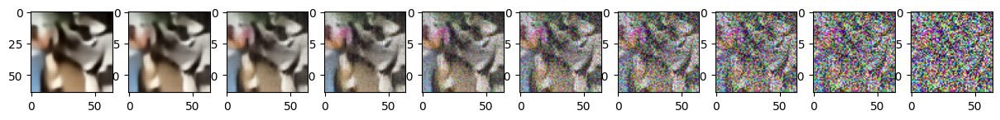

Epoch 54 | step 000 Loss: 0.12927263975143433 


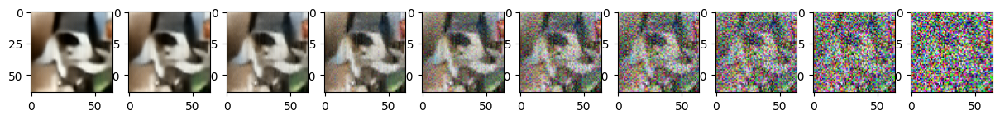

Epoch 56 | step 000 Loss: 0.13045035302639008 


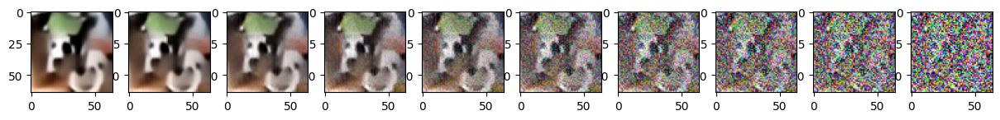

Epoch 58 | step 000 Loss: 0.11537181586027145 


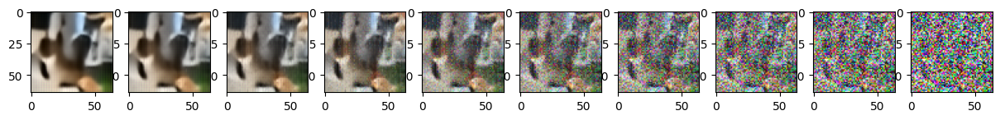

Epoch 60 | step 000 Loss: 0.16752055287361145 


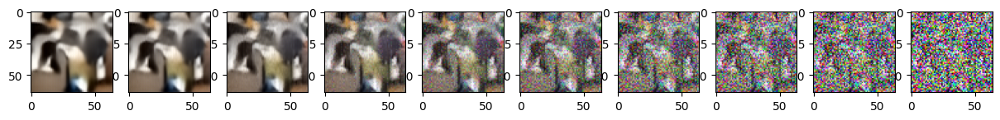

Epoch 62 | step 000 Loss: 0.13457238674163818 


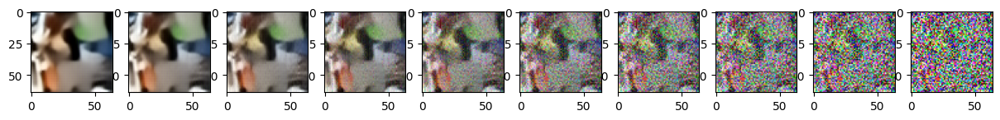

Epoch 64 | step 000 Loss: 0.14992310106754303 


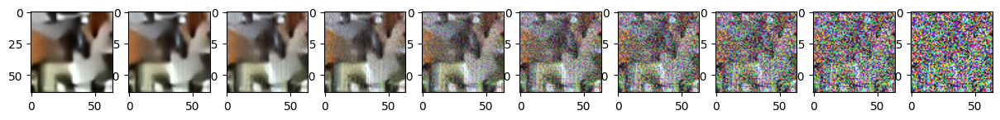

Epoch 66 | step 000 Loss: 0.17315690219402313 


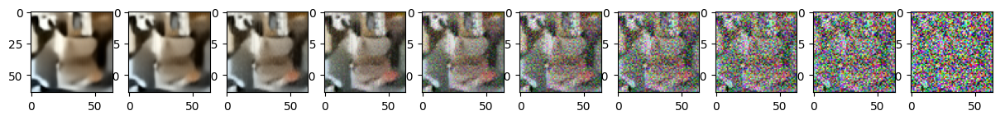

Epoch 68 | step 000 Loss: 0.20991240441799164 


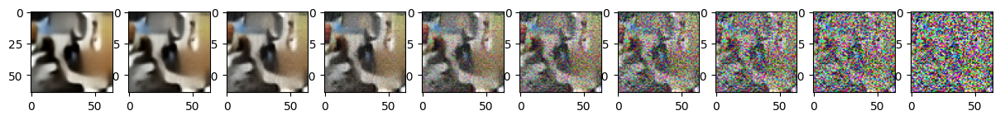

Epoch 70 | step 000 Loss: 0.11808662861585617 


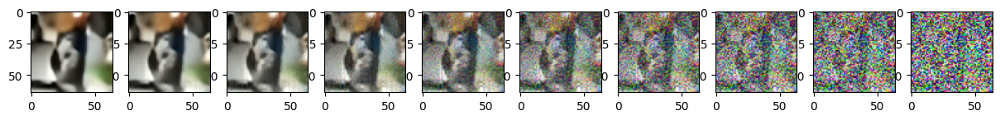

Epoch 72 | step 000 Loss: 0.14299197494983673 


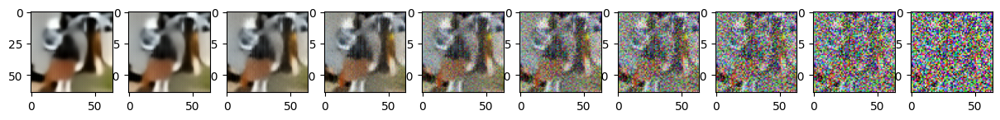

Epoch 74 | step 000 Loss: 0.14173448085784912 


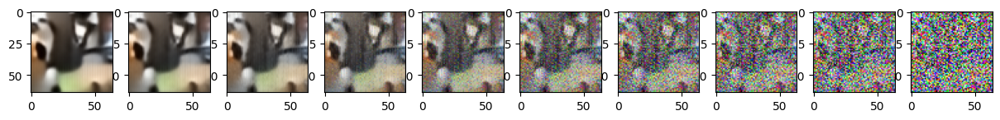

KeyboardInterrupt: 

In [ ]:
from torch.optim import Adam

T = 300
model = SimpleContinuousUnet().to(device)
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        optimizer.zero_grad()
        img = batch[0].to(device)
        batch_size = img.size(0)

        t = torch.rand((batch_size,), device=device)  # t ~ U(0,1)
        loss = get_flow_matching_loss(model, img, t, device)
        loss.backward()
        optimizer.step()

        if epoch % 2 == 0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            shape = [1, *img.shape[1:]]
            sample_and_plot_flow(model, shape, T, device)
            torch.cuda.empty_cache()



## ДЗ

Обучить модель Flow Matching на задаче style transfer (x0 - оригинальное изображение, x1 - стилизованное изображение).